In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import cv2
from PIL import Image

import torch
from torchvision.datasets import ImageFolder
from torchvision import  transforms
from torch.utils.data import DataLoader
import torch.nn as nn
import torchvision.models as models
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset

import os
from pathlib import Path


In [2]:
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames[:2]:
        print(os.path.join(dirname, filename))

/kaggle/input/buw-chest-x-ray-challange/challenge_data/submission/SUB-137.jpeg
/kaggle/input/buw-chest-x-ray-challange/challenge_data/submission/SUB-209.jpeg
/kaggle/input/buw-chest-x-ray-challange/challenge_data/val/PNEUMONIA/person1947_bacteria_4876.jpeg
/kaggle/input/buw-chest-x-ray-challange/challenge_data/val/PNEUMONIA/person1946_bacteria_4875.jpeg
/kaggle/input/buw-chest-x-ray-challange/challenge_data/val/NORMAL/NORMAL2-IM-1431-0001.jpeg
/kaggle/input/buw-chest-x-ray-challange/challenge_data/val/NORMAL/NORMAL2-IM-1440-0001.jpeg
/kaggle/input/buw-chest-x-ray-challange/challenge_data/test/PNEUMONIA/person1676_virus_2892.jpeg
/kaggle/input/buw-chest-x-ray-challange/challenge_data/test/PNEUMONIA/person1650_virus_2852.jpeg
/kaggle/input/buw-chest-x-ray-challange/challenge_data/test/NORMAL/NORMAL2-IM-0336-0001.jpeg
/kaggle/input/buw-chest-x-ray-challange/challenge_data/test/NORMAL/NORMAL2-IM-0337-0001.jpeg
/kaggle/input/buw-chest-x-ray-challange/challenge_data/train/PNEUMONIA/person118

In [3]:
path = {
    "train":Path('/kaggle/input/buw-chest-x-ray-challange/challenge_data/train'),
    "val": Path('/kaggle/input/buw-chest-x-ray-challange/challenge_data/val') ,
    "test": Path('/kaggle/input/buw-chest-x-ray-challange/challenge_data/test'),
    "submission": Path('/kaggle/input/buw-chest-x-ray-challange/challenge_data/submission')
}

In [4]:
def plot_batch(src):
    plt.figure(figsize=(50, 20))
    for i in range(len(src)):
        plt.subplot(2,4,i+1)
        plt.imshow(src[i],cmap='gray')
        plt.axis('off')
    for i in range(len(src)):
        plt.subplot(2,4,i+5)
        plt.hist(src[i].flatten(),bins=256)
        plt.ylim(0,15000)
        

laplace_kernel = np.array([[0, 1, 0],
                             [1, -4, 1],
                             [0, 1, 0]])

def gaussian(img,size,sigma):
    return cv2.GaussianBlur(img, size, sigma)
    
def unsharp_masking(img,size,sigma):
    return img - gaussian(img,size,sigma)

In [5]:
img1 = plt.imread("/kaggle/input/buw-chest-x-ray-challange/challenge_data/val/PNEUMONIA/person1947_bacteria_4876.jpeg")
img2 = plt.imread("/kaggle/input/buw-chest-x-ray-challange/challenge_data/val/PNEUMONIA/person1946_bacteria_4875.jpeg")
img3 = plt.imread("/kaggle/input/buw-chest-x-ray-challange/challenge_data/test/PNEUMONIA/person1676_virus_2892.jpeg")
img4 = plt.imread("/kaggle/input/buw-chest-x-ray-challange/challenge_data/test/PNEUMONIA/person1650_virus_2852.jpeg")
img5 = plt.imread("/kaggle/input/buw-chest-x-ray-challange/challenge_data/val/NORMAL/NORMAL2-IM-1431-0001.jpeg")



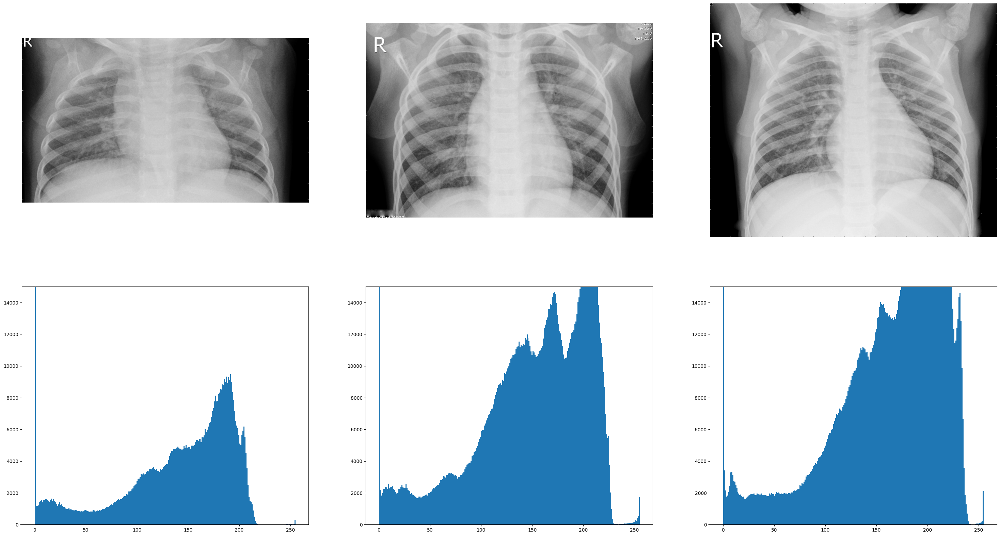

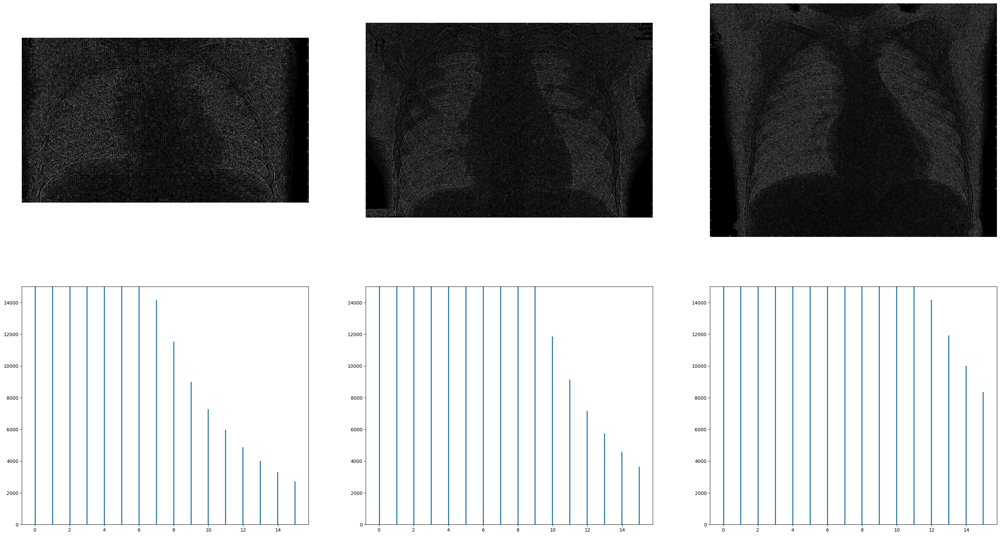

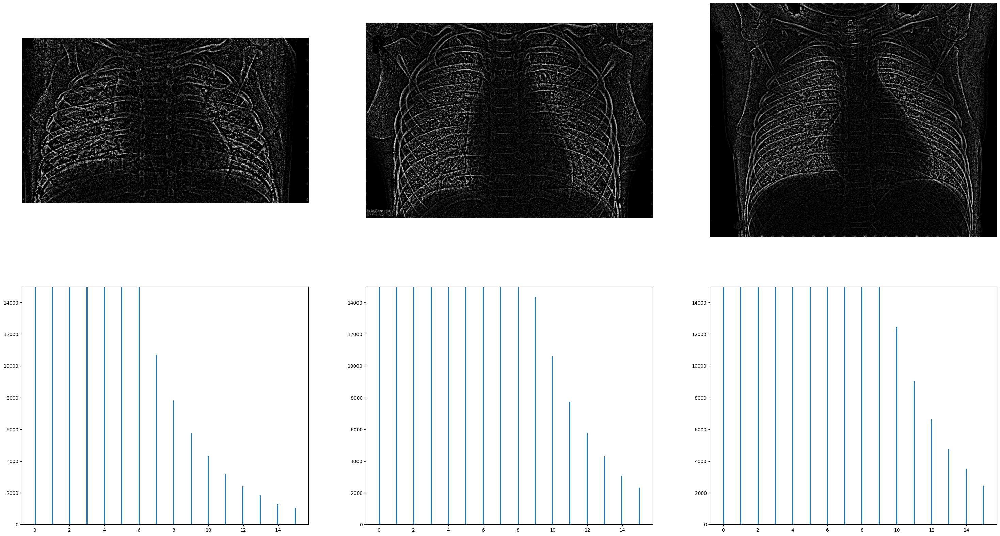

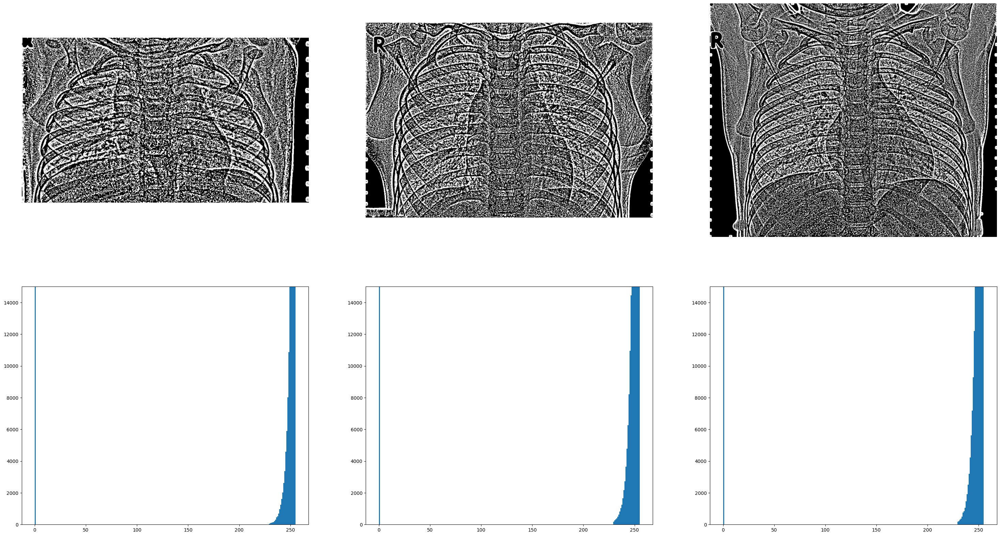

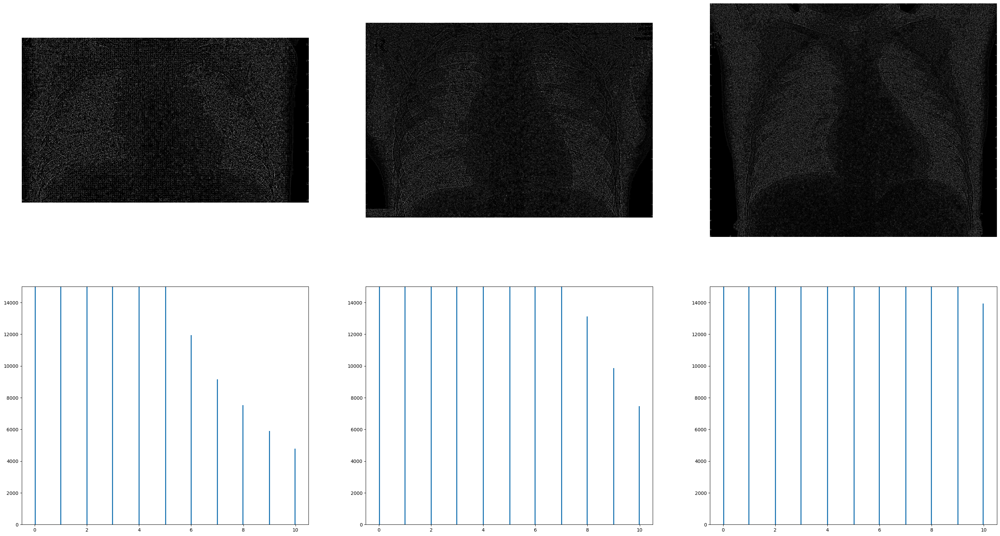

In [6]:
src = [img1,img3,img5]

plot_batch(src)

src_laplace =  [cv2.filter2D(x,-1,laplace_kernel) for x in src]
src_laplace = [np.where(x > 15,0,x) for x in src_laplace]
plot_batch(src_laplace)


src_unsharp =  [unsharp_masking(x,(21,21),5) for x in src]
src_unsharp_1 = [np.where(x > 15,0,x) for x in src_unsharp]
src_unsharp_2 = [np.where(x < 230,0,x) for x in src_unsharp]
plot_batch(src_unsharp_1)
plot_batch(src_unsharp_2)


src_laplace_and_unsharp =  [cv2.filter2D(x,-1,laplace_kernel) for x in src]
src_laplace_and_unsharp = [np.where(x > 15,0,x) for x in src_laplace_and_unsharp]
src_laplace_and_unsharp = [unsharp_masking(x,(21,21),5) for x in src_laplace_and_unsharp]
src_laplace_and_unsharp = [np.where(x > 10,0,x) for x in src_laplace_and_unsharp]


plot_batch(src_laplace_and_unsharp)

In [7]:

def gaussian_kernel(size, sigma):
    kernel = np.fromfunction(
        lambda x, y: (1/ (2 * np.pi * sigma ** 2)) * 
                     np.exp(-((x - (size - 1) / 2) ** 2 + (y - (size - 1) / 2) ** 2) / (2 * sigma ** 2)),
        (size, size)
    )
    kernel /= kernel.sum()  # Normalisierung
    return torch.tensor(kernel, dtype=torch.float32).unsqueeze(0).unsqueeze(0)


def gaussian(img, size, sigma):
    kernel = gaussian_kernel(size, sigma)
    
    if img.device != kernel.device:
        kernel = kernel.to(img.device)
    
    blurred_image = F.conv2d(img, kernel, padding=size // 2)
    
    return blurred_image
    
def unsharp_masking(img, size, sigma):
    blurred = gaussian(img, size, sigma)
    unsharp_image = img - blurred
    return unsharp_image





def filter(x: torch.Tensor):
    arr = x.numpy()  
    blurred = cv2.GaussianBlur(arr, (5, 5), 0)    
    arr_unsharpmasked = arr - blurred
    arr_unsharpmasked = arr_unsharpmasked.where(arr_unsharpmasked>15,0,arr_unsharpmasked)
    src_laplace =  [cv2.filter2D(arr_unsharpmasked,-1,laplace_kernel) for x in src]
    src_laplace = [np.where(x > 15,0,x) for x in src_laplace]
    return TensorImage(torch.tensor(src_laplace))



In [8]:

transform = transforms.Compose([
    transforms.ToTensor(),
    # transforms.Lambda(lambda img: filter(img)),  # Filter direkt in Compose
    transforms.Resize((224, 224)),
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(),
])

In [9]:
dataset = ImageFolder(root=path['train'],transform=transform)
dataloader = DataLoader(dataset, batch_size=64, shuffle=True)


In [10]:
model = models.resnet152(pretrained=True)
num_ftrs = model.fc.in_features
model.fc = torch.nn.Linear(num_ftrs, 2)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet152_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet152_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet152-394f9c45.pth" to /root/.cache/torch/hub/checkpoints/resnet152-394f9c45.pth
100%|██████████| 230M/230M [00:01<00:00, 211MB/s]


In [11]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

In [12]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

In [13]:
loss_fn = nn.CrossEntropyLoss()

In [14]:

for epoch in range(5):
    model.train()
    for inputs, labels in dataloader:
        inputs = inputs.to(device).float()  # Auf GPU verschieben und in float konvertieren
        labels = labels.to(device)

        outputs = model(inputs)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        print(f"Epoch [{epoch+1}], Loss: {loss.item():.4f}")

Epoch [1], Loss: 0.7999
Epoch [1], Loss: 0.3232
Epoch [1], Loss: 0.6888
Epoch [1], Loss: 0.2890
Epoch [1], Loss: 0.2120
Epoch [1], Loss: 0.2043
Epoch [1], Loss: 0.1199
Epoch [1], Loss: 0.1352
Epoch [1], Loss: 0.0213
Epoch [1], Loss: 0.5108
Epoch [1], Loss: 0.1843
Epoch [1], Loss: 0.1509
Epoch [1], Loss: 0.1096
Epoch [1], Loss: 0.3525
Epoch [1], Loss: 0.2129
Epoch [1], Loss: 0.1297
Epoch [1], Loss: 0.0995
Epoch [1], Loss: 0.2525
Epoch [1], Loss: 0.1163
Epoch [1], Loss: 0.0845
Epoch [1], Loss: 0.2473
Epoch [1], Loss: 0.0485
Epoch [1], Loss: 0.1502
Epoch [1], Loss: 0.0417
Epoch [1], Loss: 0.1217
Epoch [1], Loss: 0.2791
Epoch [1], Loss: 0.1368
Epoch [1], Loss: 0.0940
Epoch [1], Loss: 0.1278
Epoch [1], Loss: 0.1195
Epoch [1], Loss: 0.1749
Epoch [1], Loss: 0.0487
Epoch [1], Loss: 0.1565
Epoch [1], Loss: 0.1859
Epoch [1], Loss: 0.1767
Epoch [1], Loss: 0.1345
Epoch [1], Loss: 0.0917
Epoch [1], Loss: 0.1710
Epoch [1], Loss: 0.1822
Epoch [1], Loss: 0.1822
Epoch [1], Loss: 0.1050
Epoch [1], Loss:

# Validierung 


In [15]:
from sklearn.metrics import f1_score
from torch.utils.data import DataLoader
import torch
from torchvision import datasets

# Lade die Validierungsdaten aus dem angegebenen Pfad
valid_dataset = datasets.ImageFolder(root=path['val'], transform=transform)
valid_loader = DataLoader(valid_dataset, batch_size=32, shuffle=False)

# Setze das Modell in den Evaluierungsmodus
model.to(device)
model.eval()
# Initialisiere Listen für wahre Labels und Vorhersagen
all_labels = []
all_preds = []

# Keine Gradientenberechnung während der Evaluation
with torch.no_grad():
    for inputs, labels in valid_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        # Vorwärtsdurchlauf
        outputs = model(inputs)
        
        # Holen der Vorhersagen
        _, predicted = torch.max(outputs, 1)

        # Speichern der Labels und Vorhersagen
        all_labels.extend(labels.cpu().numpy())
        all_preds.extend(predicted.cpu().numpy())

# Berechne den F1-Score
f1 = f1_score(all_labels, all_preds, average='weighted')  # Für unbalancierte Klassen ist 'weighted' sinnvoll
print(f'F1-Score: {f1:.4f}')


F1-Score: 0.8057


In [16]:

class UnlabeledDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_paths = [os.path.join(root_dir, fname) for fname in os.listdir(root_dir)]

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        # Lade das Bild
        image_path = self.image_paths[idx]
        image = Image.open(image_path).convert("RGB")  # Stelle sicher, dass es 3 Kanäle hat

        # Wende die Transformationen an, wenn vorhanden
        if self.transform:
            image = self.transform(image)

        return image

# Definiere die Transformationen für die Vorverarbeitung der Bilder
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Beispielhafte Transformation
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Lade den unglabelten Datensatz ohne Klassengruppierung
path_unlabeled = '/kaggle/input/buw-chest-x-ray-challange/challenge_data/submission'
unlabeled_dataset = UnlabeledDataset(root_dir=path_unlabeled, transform=transform)
unlabeled_loader = DataLoader(unlabeled_dataset, batch_size=32, shuffle=False)

# Setze das Modell in den Evaluierungsmodus
model.to(device)
model.eval()

# Erstelle eine Liste für die Vorhersagen
all_preds = []

# Keine Gradientenberechnung während der Vorhersage
with torch.no_grad():
    for inputs in unlabeled_loader:
        inputs = inputs.to(device)
        
        # Vorwärtsdurchlauf
        outputs = model(inputs)
        
        # Holen der Vorhersagen
        _, predicted = torch.max(outputs, 1)
        
        # Speichern der Vorhersagen
        all_preds.extend(predicted.cpu().numpy())

# Speichere die Vorhersagen, z.B. in einer Datei
# output_path = 'submission.txt'
# with open(output_path, 'w') as f:
#     for pred in all_preds:
#         f.write(f'{pred}\n')

# print(f"Vorhersagen gespeichert in: {output_path}")

print(all_preds)

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]


In [17]:
 filenames = [x.name for x in Path.iterdir(path['submission'])]

In [18]:
submission = {
    "ID" :filenames ,
    "Label" : all_preds
}
df  = pd.DataFrame(submission)
df  =df.sort_values(by="ID", ascending=True)

df.head()
df.to_csv('submission.csv',index=0)

